# 15-minute city index comparison across cities

In [1]:
%reload_ext autoreload
%autoreload 2

## Dependencies

The `xmin` library requires [`uv`](https://docs.astral.sh/uv/) for managing
packages; installation instructions can be found
[here](https://docs.astral.sh/uv/getting-started/installation/).

Once `uv` is installed, run

```
uv sync --extra international
```

to install all dependencies necessary for executing this notebook.

In [ ]:
import datetime
from pathlib import Path

import geopandas as gpd
import pandas as pd
from tqdm.auto import tqdm

import rioxarray
import shapely
from shapely.geometry import box
from shapely.geometry.base import BaseGeometry
import requests
import json
import time

from IPython.utils import io
from contextlib import nullcontext

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

import xmin
from xmin.dataset.download import download_file, makedir
from xmin.indices import NexiGlobal, TwoStepFca

tqdm.pandas()

## Data sources

* Boundaries for urban areas are extracted from [GHS-UCDB
  R2024A](https://human-settlement.emergency.copernicus.eu/ghs_ucdb_2024.php).
* Population data are extracted from [GHS-POP
  R2023A](https://human-settlement.emergency.copernicus.eu/ghs_pop2023.php)
  (2025 estimates using a resolution of 100 meters and the World Mollweide
  projection).
* OpenStreetMap extracts are obtained using [SliceOSM's
  API](https://github.com/SliceOSM/sliceosm-api).

In [ ]:
RAW_DATA_PATH = Path("../../data/raw")  # non-processed data
INT_DATA_PATH = Path("../../data/interim")  # interim data
PRE_DATA_PATH = Path("../../data/processed")  # preprocessed data
IMG_PATH = Path("../../reports/figures/international")
xmin.config.quackosm_working_directory = Path("../../data/interim/quackosm")

In [4]:
OSM_SANTIAGO_PATH = PRE_DATA_PATH / "osm" / "Santiago_ucdb.osm.pbf"
OSM_BUENOSAIRES_PATH = PRE_DATA_PATH / "osm" / "Buenos_Aires_ucdb.osm.pbf"
OSM_BARCELONA_PATH = PRE_DATA_PATH / "osm" / "Barcelona_ucdb.osm.pbf"
OSM_SANFRANCISCO_PATH = PRE_DATA_PATH / "osm" / "San_Francisco_ucdb.osm.pbf"

TTMS_PATH = INT_DATA_PATH / "ttms"

URBAN_AREAS_PATH = (
    INT_DATA_PATH
    / "international"
    / "urban_areas"
    / "GHS_UCDB_THEME_GENERAL_CHARACTERISTICS_GLOBE_R2024A.gpkg"
)

GHSL_PATH = (
    INT_DATA_PATH
    / "international"
    / "ghsl"
    / "GHS_POP_E2025_GLOBE_R2023A_54009_100_V1_0.tif"
)

In [5]:
ucdb = gpd.read_file(
    URBAN_AREAS_PATH,
    layer="GHS_UCDB_THEME_GENERAL_CHARACTERISTICS_GLOBE_R2024A"
).to_crs(4326)

In [6]:
ghsl = rioxarray.open_rasterio(GHSL_PATH)

## Helper functions

We define functions for downloading an OSM extract (in PBF format) given a
certain urban area.

In [ ]:
def check_response_status(res: requests.Response):
    if not res.ok:
        raise RuntimeError(f"Error {res.status_code}: {res.reason}")

def update_progress_bars(progress_bars: list[tqdm | None], loading_json: dict):
    """Updates each of the three progress bars, for keeping track of SliceOSM's
    progress on the creation of the desired PBF file."""
    modes = [
        ("celdas", "Cells"),
        ("nodos", "Nodes"),
        ("elementos", "Elems")
    ]
    for i, (es_name, en_name) in enumerate(modes):
        if progress_bars[i] is None and loading_json[f"{en_name}Total"] > 0:
            progress_bars[i] = tqdm(
                total=loading_json[f"{en_name}Total"],
                desc=f"({i+1}/3) Procesando {es_name}",
                position=i
            )
        pbar = progress_bars[i]
        if pbar is not None:
            pbar.update(loading_json[f"{en_name}Prog"] - pbar.n)
            if pbar.n == loading_json[f"{en_name}Total"]:
                pbar.close()

def get_osm_extract(bounds: BaseGeometry, osm_extract_path: Path):
    """Requests SliceOSM's API for an OSM extract (in PBF format) given a
    certain region's bounds. Downloads the file to `osm_extract_path`."""
    post_res = requests.request(
        "POST",
        url="https://slice.openstreetmap.us/api/",
        json={
            "Name": "none",
            "RegionType": "geojson",
            "RegionData": json.loads(shapely.to_geojson(bounds))
        },
    )
    check_response_status(post_res)
    uuid = post_res.text

    progress_bars: list[tqdm | None] = [None, None, None]
    while True:
        loading_res = requests.request(
            "GET",
            url=f"https://slice.openstreetmap.us/api/{uuid}"
        )
        loading_json = json.loads(loading_res.text)
        update_progress_bars(progress_bars, loading_json)
        if loading_json["Complete"]:
            break
        time.sleep(5)
    for pbar in progress_bars:
        pbar.update(pbar.total - pbar.n)
        pbar.close()

    download_file(
        f"https://slice.openstreetmap.us/files/{uuid}.osm.pbf",
        osm_extract_path
    )

In [ ]:
def get_population_gdf(regions: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    """Clips the population raster based on a GeoDataFrame's total bounds,
    converting each pixel from the raster into a polygon."""

    minx, miny, maxx, maxy = regions.to_crs(ghsl.rio.crs).total_bounds
    ghsl_clipped = ghsl.rio.clip_box(minx, miny, maxx, maxy)
    
    x_coords = ghsl_clipped.coords['x'].values
    y_coords = ghsl_clipped.coords['y'].values
    population_data = ghsl_clipped.values[0]
    
    pixel_width = abs(x_coords[1] - x_coords[0])
    pixel_height = abs(y_coords[1] - y_coords[0])

    pixel_polygons = []
    for y in y_coords:
        for x in x_coords:
            pixel_poly = box(x - pixel_width/2, y - pixel_height/2, 
                            x + pixel_width/2, y + pixel_height/2)
            
            pixel_polygons.append(pixel_poly)

    return gpd.GeoDataFrame(
        {'population': population_data.flatten()},
        geometry=pixel_polygons,
        crs=ghsl.rio.crs
    )

In [ ]:
def get_amenities(osm_extract_path):
    """Given a PBF file, extracts amenities from three different categories:
    pharmacies, supermarkets/convenience stores, and public transport stops."""

    pharmacies = xmin.Amenity.from_osm(
        name="pharmacies",
        osm_path=osm_extract_path,
        osm_filter={"amenity": ["pharmacy"]},
        keep_all_tags=False
    )

    markets = xmin.Amenity.from_osm(
        name="markets",
        osm_path=osm_extract_path,
        osm_filter={"shop": ["supermarket", "convenience"]},
        keep_all_tags=False,
        weight_name="shop",
        # assign double the weight to supermarkets
        weight_map={"supermarket": 2, "convenience": 1}
    )

    transport = xmin.Amenity.from_osm(
        name="transport",
        osm_path=osm_extract_path,
        osm_filter={"public_transport": ["platform", "stop_position"]},
        keep_all_tags=["railway"],
        weight_name="railway",
        # assign weight of 1 to bus stops, 4 to train/subway stations and 2 to
        # other stops (e.g. trams)
        weight_map=lambda value: (
            1 if pd.isna(value)
            else 4 if value == "station"
            else 2
        )
    )

    return [
        pharmacies,
        markets,
        transport
    ]

In [ ]:
def get_ttms(
    city: str,
    origins: xmin.Origins,
    amenities: list[xmin.Amenity],
    osm_extract_path: Path
) -> xmin.TravelTimeMatrices:
    """Computes and saves TTMs to a CSV file if they haven't been computed
    already. If they have, loads them from the previously saved CSV file."""
    
    if (TTMS_PATH / city).exists():
        return xmin.TravelTimeMatrices(
            origins,
            amenities,
            matrices={
                amenity.name: pd.read_csv(
                    (TTMS_PATH / city / amenity.name).with_suffix(".csv")
                )
                for amenity in amenities
            }
        )
    else:
        ttms = xmin.TravelTimeMatrices.compute(
            origins=origins,
            amenities=amenities,
            gtfs_paths=[],
            osm_path=osm_extract_path,
            snap_to_network=True,
            max_time=datetime.timedelta(minutes=30),
            transport_modes=["WALK"],
        )
        makedir(TTMS_PATH / city)
        for amenity_name, ttm in ttms.matrices.items():
            ttm.to_csv(
                (TTMS_PATH / city / amenity_name).with_suffix(".csv"),
                index=False
            )
        return ttms

In [11]:
def plot_accessibility(
    acc: xmin.AccessibilityRatings,
    city: str,
    country: str,
    osm_extract_path: Path,
    ax: plt.Axes,
):
    
    # just to get borders
    acc.visualize.choropleth(
        "total",
        overlay_cfg=xmin.OverlayConfig(
            show_borders=False,
            show_scalebar=True,
            scalebar_kwds={
                "bar": {
                    "max": 20,
                    "major_div": 2,
                    "minor_type":"first",
                }
            },
        ),
        alpha=0,
        ax=ax
    )
    
    # expand limits to square size
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    xlen = x1 - x0
    ylen = y1 - y0
    extra = (xlen - ylen) / 2
    if xlen > ylen:
        ax.set_ylim(y0 - extra, y1 + extra)
    else:
        ax.set_xlim(x0 + extra, x1 - extra)
    
    # actual visualization
    acc.visualize.choropleth(
        "total",
        overlay_cfg=xmin.OverlayConfig(
            show_borders=False,
            show_roads=True,
            roads_pbf_path=osm_extract_path,
            show_basemap=True,
            basemap_kwds={
                "zoom": 12,
                "source": "CartoDB Voyager NoLabels",
                "crs": acc.gdf.estimate_utm_crs()
            },
        ),
        ax=ax
    )
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f"{city}, {country}")

In [12]:
def get_accessibility(
    city: str,
    country: str,
    osm_extract_path: Path,
    index_function: xmin.IndexFunction | dict[str, xmin.IndexFunction],
    ax: plt.Axes,
    suppress_output: bool = True
):

    ctx = io.capture_output() if suppress_output else nullcontext()
    with ctx:

        regions = ucdb[
            (ucdb["GC_UCN_MAI_2025"] == city)
            & (ucdb["GC_CNT_GAD_2025"] == country)
        ]
        bounds = regions.iloc[0].geometry
        
        # extract area if necessary
        if not osm_extract_path.exists():
            print("Obtaining OSM extract...")
            get_osm_extract(bounds, osm_extract_path)
        
        # origins
        print("Obtaining population...")
        population_gdf = get_population_gdf(regions)
        print("Creating origins...")
        origins = xmin.Origins.create_grid(
            regions,
            h3_resolution=9,
            population_gdf=population_gdf
        )
        
        # destinations
        print("Obtaining destinations...")
        amenities_list = get_amenities(osm_extract_path)
        
        # travel time matrices
        print("Obtaining TTMs...")
        ttms = get_ttms(city, origins, amenities_list, osm_extract_path)
        
        # accessibility ratings
        acc = xmin.AccessibilityRatings.compute(
            ttms,
            index_function=index_function,
        )

        print("Creating visualization...")
        plot_accessibility(acc, city, country, osm_extract_path, ax)
    
    return acc

## Visualizations

Having defined the previous functions, we can create visualizations for 4
different cities using both the NEXI-Global and 2SFCA accessibility functions.

(1/4) Computing Santiago...
(2/4) Computing Buenos Aires...
(3/4) Computing Barcelona...
(4/4) Computing San Francisco...
Final touches...


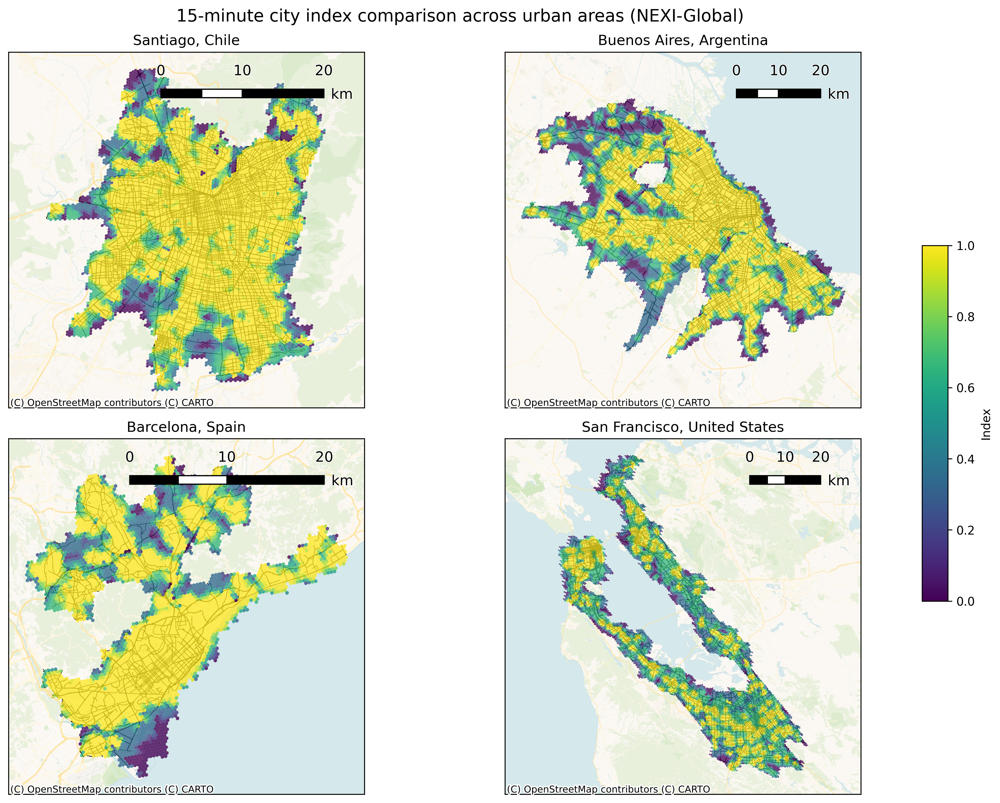

In [14]:
fig = plt.figure(figsize=(2 * 6.4, 2 * 4.8), dpi=300)
gs = GridSpec(4, 3, figure=fig, width_ratios=[20, 20, 1])
ax_stgo = fig.add_subplot(gs[0:2, 0])
ax_bsas = fig.add_subplot(gs[0:2, 1])
ax_bcn = fig.add_subplot(gs[2:4, 0])
ax_frisco = fig.add_subplot(gs[2:4, 1])
ax_cb = fig.add_subplot(gs[1:3, 2])

index = NexiGlobal(15, 30)

print("(1/4) Computing Santiago...")
acc_stgo = get_accessibility(
    "Santiago",
    "Chile",
    OSM_SANTIAGO_PATH,
    index,
    ax=ax_stgo
)

print("(2/4) Computing Buenos Aires...")  
acc_bsas = get_accessibility(
    "Buenos Aires",
    "Argentina",
    OSM_BUENOSAIRES_PATH,
    index,
    ax=ax_bsas
)

print("(3/4) Computing Barcelona...")
acc_bcn = get_accessibility(
    "Barcelona",
    "Spain",
    OSM_BARCELONA_PATH,
    index,
    ax=ax_bcn
)

print("(4/4) Computing San Francisco...")
acc_frisco = get_accessibility(
    "San Francisco",
    "United States",
    OSM_SANFRANCISCO_PATH,
    index,
    ax=ax_frisco
)

print("Final touches...")

cbar = plt.cm.ScalarMappable(cmap="viridis")
axCbar = fig.colorbar(cbar, cax=ax_cb)
axCbar.set_label(f"Index")

fig.suptitle(
    "15-minute city index comparison across urban areas (NEXI-Global)",
    fontsize="x-large",
)

plt.tight_layout()
plt.savefig(IMG_PATH / "international_nexi.pdf")

(1/4) Computing Santiago...
(2/4) Computing Buenos Aires...
(3/4) Computing Barcelona...
(4/4) Computing San Francisco...
Final touches...


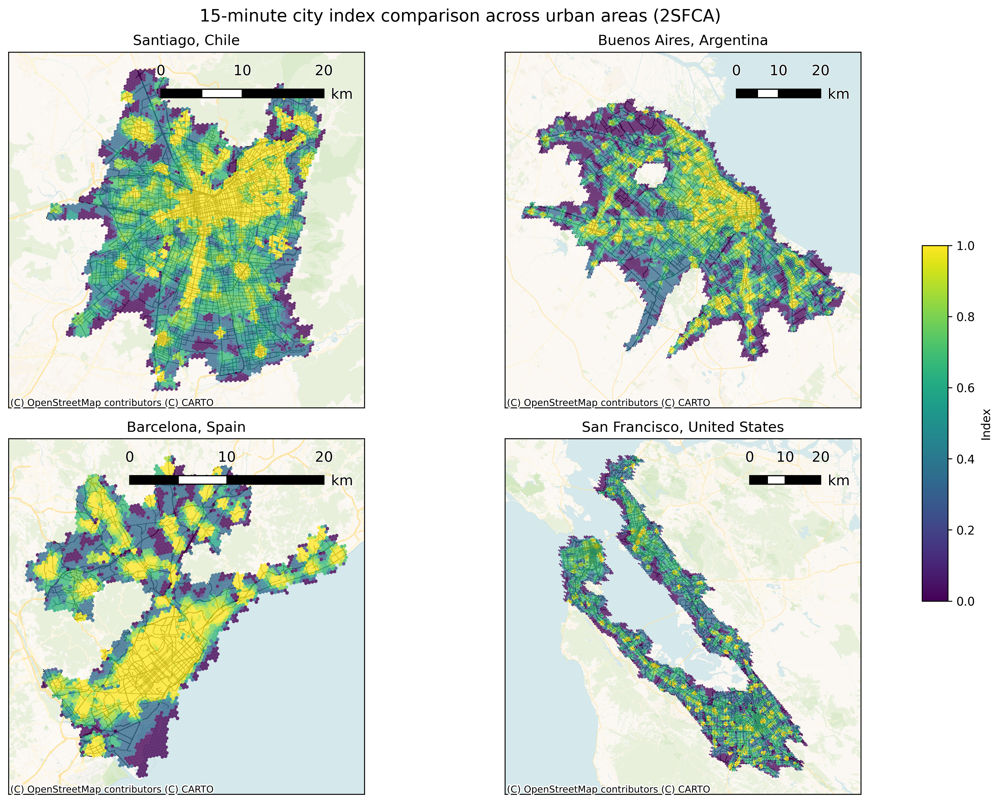

In [16]:
fig = plt.figure(figsize=(2 * 6.4, 2 * 4.8), dpi=300)
gs = GridSpec(4, 3, figure=fig, width_ratios=[100, 100, 5])
ax_stgo = fig.add_subplot(gs[0:2, 0])
ax_bsas = fig.add_subplot(gs[0:2, 1])
ax_bcn = fig.add_subplot(gs[2:4, 0])
ax_frisco = fig.add_subplot(gs[2:4, 1])
ax_cb = fig.add_subplot(gs[1:3, 2])

index = TwoStepFca(15, 3_000)

print("(1/4) Computing Santiago...")
acc_stgo = get_accessibility(
    "Santiago",
    "Chile",
    OSM_SANTIAGO_PATH,
    index,
    ax=ax_stgo
)

print("(2/4) Computing Buenos Aires...")  
acc_bsas = get_accessibility(
    "Buenos Aires",
    "Argentina",
    OSM_BUENOSAIRES_PATH,
    index,
    ax=ax_bsas
)

print("(3/4) Computing Barcelona...")
acc_bcn = get_accessibility(
    "Barcelona",
    "Spain",
    OSM_BARCELONA_PATH,
    index,
    ax=ax_bcn
)

print("(4/4) Computing San Francisco...")
acc_frisco = get_accessibility(
    "San Francisco",
    "United States",
    OSM_SANFRANCISCO_PATH,
    index,
    ax=ax_frisco
)

print("Final touches...")

cbar = plt.cm.ScalarMappable(cmap="viridis")
axCbar = fig.colorbar(cbar, cax=ax_cb)
axCbar.set_label(f"Index")

fig.suptitle(
    "15-minute city index comparison across urban areas (2SFCA)",
    fontsize="x-large",
)

plt.tight_layout()
plt.savefig(IMG_PATH / "international_2sfca.pdf")